In [3]:
# Importing libraries 

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
import re
import random
import seaborn as sns
import datetime
from os import listdir
from matplotlib import rc
from datetime import datetime

from mpl_toolkits.mplot3d.axes3d import Axes3D

# set this so the graphs open internally
%matplotlib inline


from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA, KernelPCA


# Part 1: Importing Dataset

In [4]:
directory = "C:/Users/joeyh/OneDrive/Applied Data Science with Machine Learning/DS105_Machine Learning For Data Science/Final Project/"
EURUSD = pd.read_csv(directory + 'EURUSD60.csv',names=['Date', 'Time', 'Open', 'High', 'Low', 'Close', 'Volume'])
EURUSD.head()

,Date,Time,Open,High,Low,Close,Volume
0,2010.10.21,15:00,1.40200,1.40325,1.39772,1.39907,3479
1,2010.10.21,16:00,1.39910,1.40142,1.39657,1.40036,3667
2,2010.10.21,17:00,1.40039,1.40368,1.39862,1.40021,4126
3,2010.10.21,18:00,1.40027,1.40120,1.39497,1.39726,3577
4,2010.10.21,19:00,1.39724,1.39813,1.39299,1.39350,2960


### The datasets are all imported and ready for futher processing.

# Part 2: Data Exploration and Preprocessing

### 1. To have a quick understanding of the imported 7 datasets

In [5]:
EURUSD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65000 entries, 0 to 64999
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    65000 non-null  object 
 1   Time    65000 non-null  object 
 2   Open    65000 non-null  float64
 3   High    65000 non-null  float64
 4   Low     65000 non-null  float64
 5   Close   65000 non-null  float64
 6   Volume  65000 non-null  int64  
dtypes: float64(4), int64(1), object(2)
memory usage: 3.5+ MB


In [6]:
EURUSD.describe()

,Open,High,Low,Close,Volume
count,65000.000000,65000.000000,65000.000000,65000.000000,65000.000000
mean,1.214468,1.215346,1.213613,1.214467,3413.719246
std,0.109665,0.109773,0.109549,0.109662,2634.165019
min,1.035550,1.037000,1.032490,1.035560,1.000000
25%,1.119870,1.120658,1.119168,1.119880,1533.000000
50%,1.182415,1.183200,1.181640,1.182410,2712.000000
75%,1.313963,1.315002,1.312992,1.313980,4528.000000
max,1.493150,1.493850,1.490500,1.493190,37898.000000


In [7]:
EURUSD.columns

Index(['Date', 'Time', 'Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')

### 2. Verify any empty cell in the datasets

In [8]:
EURUSD.isnull().values.any()
    

False

 > <font color='green'> * **All good and no empty cells in all the datasets** </font>

### 3. Date and Time Series Columns

In [9]:
# The datasets' date and time are in separate columns and not in datetime format based on the file imported.
# We are combinding the data and time in a new column 'Date_&_Time'
EURUSD.insert(0, 'Date_&_Time', '')
EURUSD['Date_&_Time'] = EURUSD['Date'] + ' ' + EURUSD['Time']
EURUSD['Date_&_Time'] = pd.to_datetime(EURUSD['Date_&_Time'])
display(EURUSD.info(verbose=True))
EURUSD.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65000 entries, 0 to 64999
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date_&_Time  65000 non-null  datetime64[ns]
 1   Date         65000 non-null  object        
 2   Time         65000 non-null  object        
 3   Open         65000 non-null  float64       
 4   High         65000 non-null  float64       
 5   Low          65000 non-null  float64       
 6   Close        65000 non-null  float64       
 7   Volume       65000 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1), object(2)
memory usage: 4.0+ MB


None

,Date_&_Time,Date,Time,Open,High,Low,Close,Volume
0,2010-10-21 15:00:00,2010.10.21,15:00,1.40200,1.40325,1.39772,1.39907,3479
1,2010-10-21 16:00:00,2010.10.21,16:00,1.39910,1.40142,1.39657,1.40036,3667
2,2010-10-21 17:00:00,2010.10.21,17:00,1.40039,1.40368,1.39862,1.40021,4126
3,2010-10-21 18:00:00,2010.10.21,18:00,1.40027,1.40120,1.39497,1.39726,3577
4,2010-10-21 19:00:00,2010.10.21,19:00,1.39724,1.39813,1.39299,1.39350,2960


In [10]:
# We are ready to drop the original 'Date' and 'Time' columns
EURUSD.drop('Date', axis='columns', inplace=True)
EURUSD.drop('Time', axis='columns', inplace=True)
EURUSD.head()

,Date_&_Time,Open,High,Low,Close,Volume
0,2010-10-21 15:00:00,1.40200,1.40325,1.39772,1.39907,3479
1,2010-10-21 16:00:00,1.39910,1.40142,1.39657,1.40036,3667
2,2010-10-21 17:00:00,1.40039,1.40368,1.39862,1.40021,4126
3,2010-10-21 18:00:00,1.40027,1.40120,1.39497,1.39726,3577
4,2010-10-21 19:00:00,1.39724,1.39813,1.39299,1.39350,2960


 > <font color='green'> * **'Date_&_Time' column is ready is ready** </font>

In [11]:
# To ensure dataframe are sorted by 'Date_&_Time' in ascending order
EURUSD.sort_values(by = 'Date_&_Time')

,Date_&_Time,Open,High,Low,Close,Volume
0,2010-10-21 15:00:00,1.40200,1.40325,1.39772,1.39907,3479
1,2010-10-21 16:00:00,1.39910,1.40142,1.39657,1.40036,3667
2,2010-10-21 17:00:00,1.40039,1.40368,1.39862,1.40021,4126
3,2010-10-21 18:00:00,1.40027,1.40120,1.39497,1.39726,3577
4,2010-10-21 19:00:00,1.39724,1.39813,1.39299,1.39350,2960
...,...,...,...,...,...,...
64995,2021-04-16 20:00:00,1.19785,1.19808,1.19756,1.19808,1190
64996,2021-04-16 21:00:00,1.19807,1.19836,1.19769,1.19769,670
64997,2021-04-16 22:00:00,1.19769,1.19796,1.19725,1.19784,676
64998,2021-04-16 23:00:00,1.19783,1.19823,1.19783,1.19813,988


### 4. Creating Additional Features

In [13]:

# Inserting simple moving average (SMA) for last 12 and 24 hours
EURUSD.loc[:,'SMA09'] = EURUSD['Close'].rolling(window=9).mean()
EURUSD.loc[:,'SMA12'] = EURUSD['Close'].rolling(window=12).mean()
EURUSD.loc[:,'SMA24'] = EURUSD['Close'].rolling(window=24).mean()

# Inserting exponentjial moving averages
EURUSD.loc[:,'EMA09'] = EURUSD['Close'].ewm(span=9, adjust=False).mean()
EURUSD.loc[:,'EMA12'] = EURUSD['Close'].ewm(span=12, adjust=False).mean()
EURUSD.loc[:,'EMA13'] = EURUSD['Close'].ewm(span=13, adjust=False).mean()
EURUSD.loc[:,'EMA26'] = EURUSD['Close'].ewm(span=26, adjust=False).mean()
EURUSD.loc[:,'MACD'] = EURUSD['EMA12']-EURUSD['EMA26']


# Inserting moving minimum and maximum price for last 12 hours
EURUSD.loc[:,'Min12'] = EURUSD['Close'].rolling(window=12).min()
EURUSD.loc[:,'Max12'] = EURUSD['Close'].rolling(window=12).max()

# Inserting moving minimum and maximum price for last 24 hours
EURUSD.loc[:,'Min24'] = EURUSD['Close'].rolling(window=24).min()
EURUSD.loc[:,'Max24'] = EURUSD['Close'].rolling(window=24).max()

# Inserting price difference for the period
EURUSD.loc[:,'OpenVsClose'] = EURUSD['Close'] - EURUSD['Open']
EURUSD.loc[:,'HighVsLow'] = EURUSD['High'] - EURUSD['Low']
EURUSD.loc[:,'Close_Vs_exClose'] = EURUSD['Close'].diff() # Current close price vs last close price
EURUSD.loc[:,'Open_Vs_exOpen'] = EURUSD['Open'].diff() # Current open price vs last open price

# Inserting average price for the period
EURUSD.loc[:,'Average'] = (EURUSD['High'] + EURUSD['Low'])/2

# Inserting volume related features
EURUSD.loc[:,'Momentum'] = EURUSD['Volume']*(EURUSD['Close'] - EURUSD['Open']) # momentum for the period

# Inserting bull and bear power indicators
EURUSD.loc[:,'Bull_Power'] = EURUSD['High']-EURUSD['EMA13']    
EURUSD.loc[:,'Bear_Power'] = EURUSD['Low']-EURUSD['EMA13']   
    


In [14]:
EURUSD.head()

,Date_&_Time,Open,High,Low,Close,Volume,SMA09,SMA12,SMA24,EMA09,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
0,2010-10-21 15:00:00,1.40200,1.40325,1.39772,1.39907,3479,NaN,NaN,NaN,1.399070,...,NaN,NaN,-0.00293,0.00553,NaN,NaN,1.400485,-10.19347,0.004180,-0.001350
1,2010-10-21 16:00:00,1.39910,1.40142,1.39657,1.40036,3667,NaN,NaN,NaN,1.399328,...,NaN,NaN,0.00126,0.00485,0.00129,-0.00290,1.398995,4.62042,0.002166,-0.002684
2,2010-10-21 17:00:00,1.40039,1.40368,1.39862,1.40021,4126,NaN,NaN,NaN,1.399504,...,NaN,NaN,-0.00018,0.00506,-0.00015,0.00129,1.401150,-0.74268,0.004289,-0.000771
3,2010-10-21 18:00:00,1.40027,1.40120,1.39497,1.39726,3577,NaN,NaN,NaN,1.399056,...,NaN,NaN,-0.00301,0.00623,-0.00295,-0.00012,1.398085,-10.76677,0.002114,-0.004116
4,2010-10-21 19:00:00,1.39724,1.39813,1.39299,1.39350,2960,NaN,NaN,NaN,1.397944,...,NaN,NaN,-0.00374,0.00514,-0.00376,-0.00303,1.395560,-11.07040,-0.000158,-0.005298


In [15]:
# Verify any empty cell in the datasets after introduced the additional features

print('Columns with empty cells:')
print(EURUSD.columns[EURUSD.isnull().any()].tolist())

print('Row with empty cells:')
print(list(EURUSD[EURUSD.isnull().any(axis=1)].index))
print('')



Columns with empty cells:
['SMA09', 'SMA12', 'SMA24', 'Min12', 'Max12', 'Min24', 'Max24', 'Close_Vs_exClose', 'Open_Vs_exOpen']
Row with empty cells:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]



 > <font color='green'> * **The first 23 rows of data are introduced with NAN value after the additional features were created** </font>

### 5. Check date and time range of the dataset and removing all NAN value row

In [16]:
print('Earliest record:', EURUSD['Date_&_Time'].min())
print('Last record:', EURUSD['Date_&_Time'].max())
print('Number of row:', len(EURUSD.index))

Earliest record: 2010-10-21 15:00:00
Last record: 2021-04-17 00:00:00
Number of row: 65000


 > **In order to standardize the date range for all forex pairs and removing all NAN value row, we will keep data between <font color='red'>2011-04-01 00:00 to 2021-03-31 23:00</font> only**

In [17]:
# Setting the start_time and end_time
start_time = datetime.strptime('2011-04-01 00:00:00', '%Y-%m-%d %H:%M:%S')
end_time = datetime.strptime('2021-03-31 23:00:00', '%Y-%m-%d %H:%M:%S')

In [18]:
#greater than the start date and smaller than the end date
# setting the data slicing criteria
mask = (EURUSD['Date_&_Time'] >= start_time) & (EURUSD['Date_&_Time'] <= end_time)
EURUSD = EURUSD.loc[mask]

    

In [19]:
print('Earliest record:', EURUSD['Date_&_Time'].min())
print('Last record:', EURUSD['Date_&_Time'].max())
print('Number of row:', len(EURUSD.index))
EURUSD.head()

Earliest record: 2011-04-01 00:00:00
Last record: 2021-03-31 23:00:00
Number of row: 61953


,Date_&_Time,Open,High,Low,Close,Volume,SMA09,SMA12,SMA24,EMA09,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
2758,2011-04-01 00:00:00,1.41569,1.41740,1.41555,1.41736,1514,1.418322,1.418833,1.417220,1.418011,...,1.41253,1.42266,0.00167,0.00185,0.00171,-0.00158,1.416475,2.52838,-0.000544,-0.002394
2759,2011-04-01 01:00:00,1.41733,1.41737,1.41563,1.41568,1850,1.418049,1.418428,1.417351,1.417545,...,1.41269,1.42266,-0.00165,0.00174,-0.00168,0.00164,1.416500,-3.05250,-0.000251,-0.001991
2760,2011-04-01 02:00:00,1.41568,1.41635,1.41529,1.41555,1504,1.417668,1.417836,1.417470,1.417146,...,1.41316,1.42266,-0.00013,0.00106,-0.00013,-0.00165,1.415820,-0.19552,-0.000975,-0.002035
2761,2011-04-01 03:00:00,1.41557,1.41666,1.41553,1.41644,2145,1.417458,1.417714,1.417587,1.417005,...,1.41316,1.42266,0.00087,0.00113,0.00089,-0.00011,1.416095,1.86615,-0.000539,-0.001669
2762,2011-04-01 04:00:00,1.41645,1.41708,1.41561,1.41612,1937,1.417137,1.417546,1.417680,1.416828,...,1.41316,1.42266,-0.00033,0.00147,-0.00032,0.00088,1.416345,-0.63921,0.000035,-0.001435


In [308]:
EURUSD.describe()

,Open,High,Low,Close,Volume,SMA09,SMA12,SMA24,EMA09,EMA12,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
count,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,...,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000,61953.000000
mean,1.208120,1.208979,1.207285,1.208119,3434.710022,1.208135,1.208141,1.208164,1.208135,1.208141,...,1.204428,1.211893,-0.000002,0.001694,-0.000004,-0.000004,1.208132,-0.016912,0.000836,-0.000858
std,0.107615,0.107702,0.107520,0.107611,2679.068435,0.107613,0.107613,0.107617,0.107607,0.107606,...,0.107192,0.108020,0.001299,0.001368,0.001315,0.001318,0.107609,10.088321,0.002083,0.002091
min,1.035550,1.037000,1.032490,1.035560,1.000000,1.037753,1.038077,1.038795,1.037817,1.038189,...,1.035560,1.040950,-0.022830,0.000000,-0.022720,-0.022830,1.036180,-452.239470,-0.018331,-0.033991
25%,1.118320,1.119130,1.117560,1.118330,1514.000000,1.118398,1.118396,1.118423,1.118366,1.118383,...,1.115110,1.121370,-0.000510,0.000830,-0.000510,-0.000520,1.118365,-1.271520,-0.000238,-0.001728
50%,1.177420,1.178110,1.176670,1.177430,2708.000000,1.177429,1.177424,1.177526,1.177465,1.177488,...,1.174210,1.180620,0.000010,0.001320,0.000000,0.000000,1.177445,0.004450,0.000631,-0.000611
75%,1.305590,1.306510,1.304540,1.305590,4575.000000,1.305602,1.305559,1.305510,1.305575,1.305519,...,1.301480,1.309610,0.000520,0.002110,0.000520,0.000520,1.305555,1.264980,0.001729,0.000242
max,1.493150,1.493850,1.490500,1.493190,37898.000000,1.487638,1.486987,1.486059,1.487489,1.486627,...,1.482560,1.493190,0.021050,0.024980,0.021060,0.021040,1.491995,311.406800,0.034581,0.015848


In [20]:
EURUSD = EURUSD.set_index('Date_&_Time')
EURUSD.head()

,Open,High,Low,Close,Volume,SMA09,SMA12,SMA24,EMA09,EMA12,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
Date_&_Time,,,,,,,,,,,,,,,,,,,,,
2011-04-01 00:00:00,1.41569,1.41740,1.41555,1.41736,1514,1.418322,1.418833,1.417220,1.418011,1.417991,...,1.41253,1.42266,0.00167,0.00185,0.00171,-0.00158,1.416475,2.52838,-0.000544,-0.002394
2011-04-01 01:00:00,1.41733,1.41737,1.41563,1.41568,1850,1.418049,1.418428,1.417351,1.417545,1.417636,...,1.41269,1.42266,-0.00165,0.00174,-0.00168,0.00164,1.416500,-3.05250,-0.000251,-0.001991
2011-04-01 02:00:00,1.41568,1.41635,1.41529,1.41555,1504,1.417668,1.417836,1.417470,1.417146,1.417315,...,1.41316,1.42266,-0.00013,0.00106,-0.00013,-0.00165,1.415820,-0.19552,-0.000975,-0.002035
2011-04-01 03:00:00,1.41557,1.41666,1.41553,1.41644,2145,1.417458,1.417714,1.417587,1.417005,1.417180,...,1.41316,1.42266,0.00087,0.00113,0.00089,-0.00011,1.416095,1.86615,-0.000539,-0.001669
2011-04-01 04:00:00,1.41645,1.41708,1.41561,1.41612,1937,1.417137,1.417546,1.417680,1.416828,1.417017,...,1.41316,1.42266,-0.00033,0.00147,-0.00032,0.00088,1.416345,-0.63921,0.000035,-0.001435


In [21]:
# Verify any empty cell in the datasets again
EURUSD.isnull().values.any()

False

### 6. Creating simple plots to examine the data

C:\Users\joeyh\anaconda3\lib\site-packages\mplfinance\_arg_validators.py:35: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


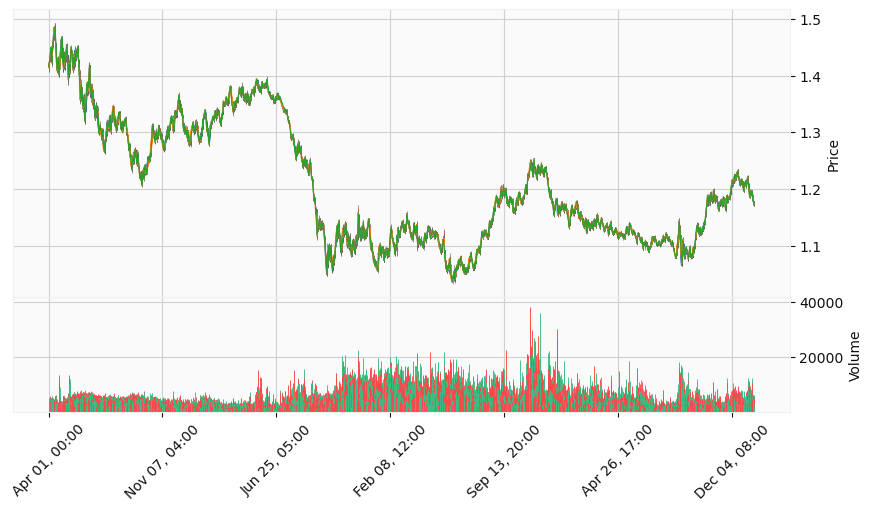

In [22]:
# Ploting candle stick chart
import mplfinance as mpf

# First we set the kwargs that we will use for all of these examples:
kwargs = dict(type='candle', mav=(9,12,24),volume=True,figratio=(15,8),figscale=1)

mpf.plot(EURUSD, **kwargs,style='yahoo')

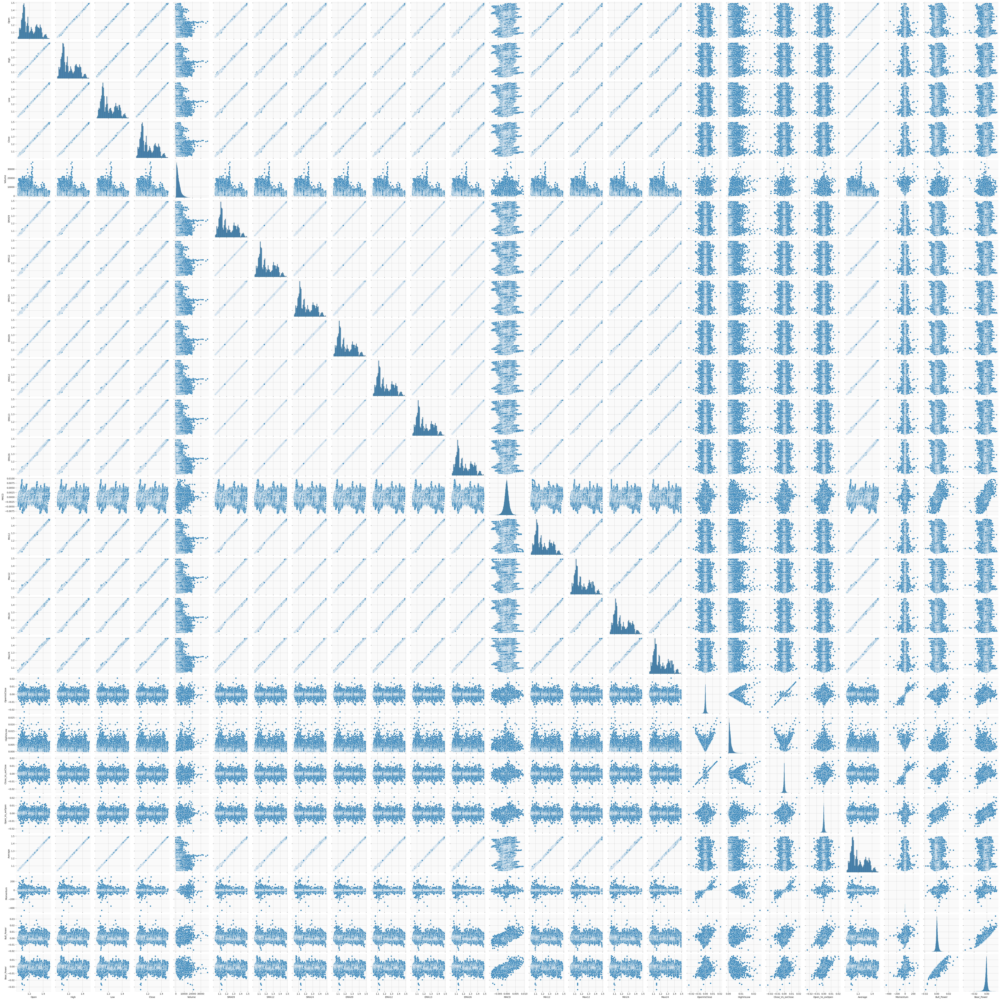

In [23]:
sns.pairplot(EURUSD)

C:\Users\joeyh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Close', ylabel='Density'>

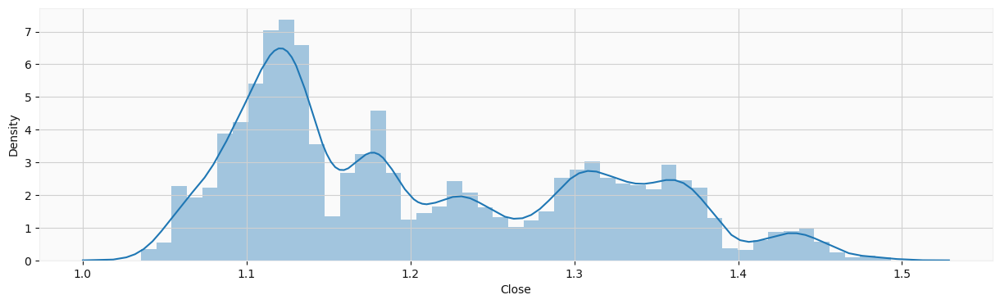

In [309]:
fig, ax = plt.subplots(figsize=(15,4))       
sns.distplot(EURUSD['Close'])

In [25]:
EURUSD.corr()

,Open,High,Low,Close,Volume,SMA09,SMA12,SMA24,EMA09,EMA12,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
Open,1.000000,0.999954,0.999956,0.999927,-0.243097,0.999870,0.999802,0.999524,0.999912,0.999865,...,0.999388,0.999321,-0.008794,0.132559,-0.008155,0.003705,0.999975,-0.008699,0.051727,-0.035220
High,0.999954,1.000000,0.999921,0.999959,-0.239068,0.999832,0.999762,0.999480,0.999881,0.999830,...,0.999306,0.999336,-0.002397,0.138933,-0.001854,0.003835,0.999980,-0.003309,0.055914,-0.035221
Low,0.999956,0.999921,1.000000,0.999961,-0.246989,0.999830,0.999759,0.999476,0.999880,0.999829,...,0.999399,0.999236,-0.002355,0.126441,-0.001812,0.003900,0.999980,-0.003389,0.051910,-0.031036
Close,0.999927,0.999959,0.999961,1.000000,-0.243145,0.999815,0.999743,0.999461,0.999870,0.999817,...,0.999346,0.999275,0.003272,0.132520,0.003725,0.003664,0.999980,0.001308,0.054526,-0.032408
Volume,-0.243097,-0.239068,-0.246989,-0.243145,1.000000,-0.242750,-0.242673,-0.242815,-0.242877,-0.242841,...,-0.248161,-0.237654,-0.003309,0.590730,-0.001105,-0.007894,-0.243030,0.006129,0.183590,-0.203682
SMA09,0.999870,0.999832,0.999830,0.999815,-0.242750,1.000000,0.999981,0.999776,0.999989,0.999984,...,0.999560,0.999513,-0.007309,0.132803,-0.007018,-0.005756,0.999851,-0.007799,0.038668,-0.048385
SMA12,0.999802,0.999762,0.999759,0.999743,-0.242673,0.999981,1.000000,0.999857,0.999971,0.999986,...,0.999612,0.999575,-0.007596,0.132861,-0.007324,-0.006389,0.999780,-0.008043,0.034641,-0.052432
SMA24,0.999524,0.999480,0.999476,0.999461,-0.242815,0.999776,0.999857,1.000000,0.999790,0.999861,...,0.999733,0.999732,-0.007960,0.132931,-0.007742,-0.007280,0.999498,-0.008380,0.025612,-0.061468
EMA09,0.999912,0.999881,0.999880,0.999870,-0.242877,0.999989,0.999971,0.999790,1.000000,0.999992,...,0.999590,0.999543,-0.006250,0.132753,-0.005952,-0.004104,0.999901,-0.006866,0.040800,-0.046228
EMA12,0.999865,0.999830,0.999829,0.999817,-0.242841,0.999984,0.999986,0.999861,0.999992,1.000000,...,0.999644,0.999606,-0.006765,0.132808,-0.006484,-0.004989,0.999849,-0.007321,0.037535,-0.049515


<AxesSubplot:>

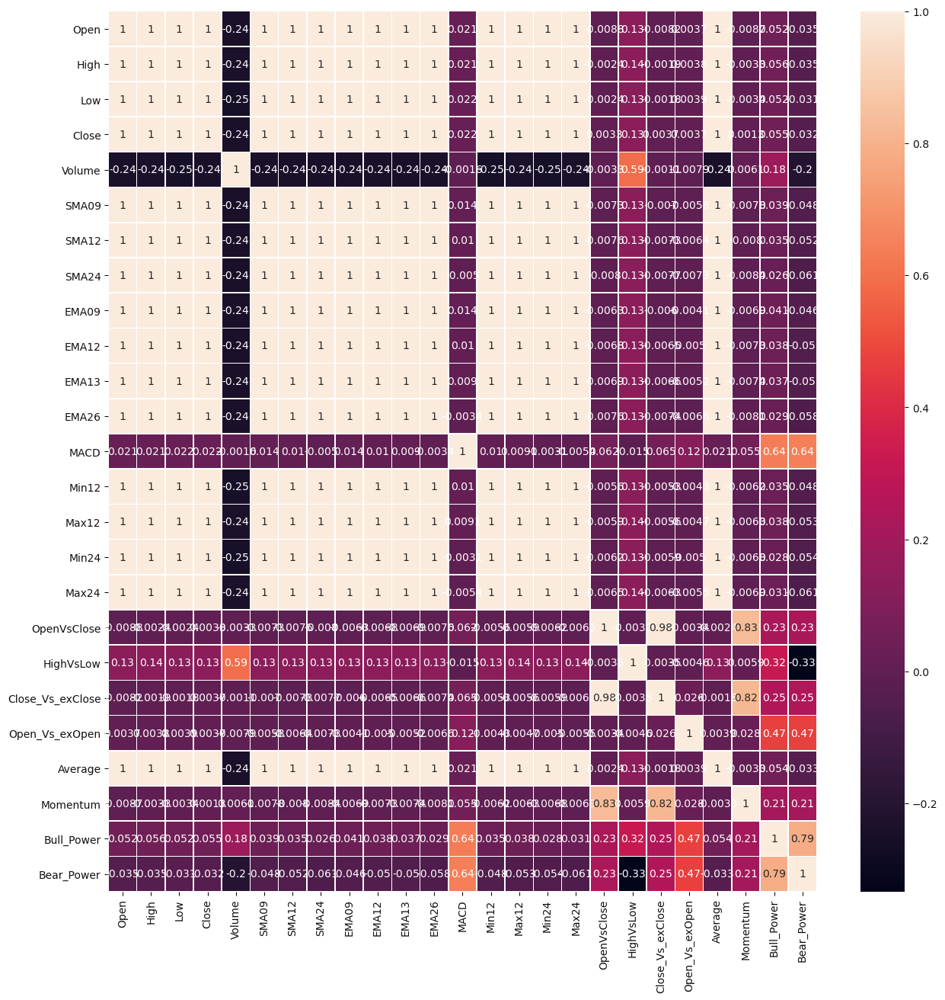

In [26]:
fig, ax = plt.subplots(figsize=(15,15))         
sns.heatmap(EURUSD.corr(), annot=True, linewidths=.5, ax=ax)

# Part 3: Regression Model Training

### 1. Training a Regression Model

In [251]:
# X and y arrays
y = EURUSD['Close']
X = EURUSD[['Open','High','Low','Volume','SMA09', 'SMA12', 'SMA24', 'EMA09', 'EMA12', 'EMA13', 'EMA26', 'MACD',
         'Min12', 'Max12', 'Min24', 'Max24', 'OpenVsClose', 'HighVsLow',
         'Close_Vs_exClose', 'Open_Vs_exOpen', 'Average', 'Momentum',
         'Bull_Power', 'Bear_Power']]


In [252]:
# Train and test set split
from sklearn.model_selection import train_test_split    
   
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)



In [113]:
from sklearn import preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler

In [254]:
columnTransformer = ColumnTransformer([('encoder', MinMaxScaler(), [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])], remainder='passthrough')

In [255]:
X_train_minmax = np.array(columnTransformer.fit_transform(X_train), dtype = np.float)

In [276]:
# Examine all the columns to be properly scaled, with min value = 0, max value = 1

df = pd.DataFrame(X_train_minmax, columns = ['Open','High','Low','Volume',
                                               'SMA09', 'SMA12', 'SMA24', 'EMA09',
                                               'EMA12', 'EMA13', 'EMA26', 'MACD',
                                               'Min12', 'Max12', 'Min24', 'Max24',
                                               'OpenVsClose', 'HighVsLow','Close_Vs_exClose', 'Open_Vs_exOpen',
                                               'Average', 'Momentum','Bull_Power', 'Bear_Power'])
df.describe()

,Open,High,Low,Volume,SMA09,SMA12,SMA24,EMA09,EMA12,EMA13,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
count,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,...,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000,43367.000000
mean,0.381465,0.380417,0.383351,0.090568,0.379648,0.379714,0.379540,0.380143,0.379992,0.379917,...,0.378689,0.378504,0.520238,0.067744,0.518856,0.444109,0.381108,0.600222,0.378796,0.613026
std,0.237884,0.238244,0.237848,0.070437,0.239815,0.240286,0.241175,0.240176,0.240593,0.240716,...,0.240339,0.239568,0.029461,0.054150,0.029878,0.034676,0.238502,0.013321,0.047195,0.048187
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.182762,0.181431,0.184621,0.040109,0.179502,0.179185,0.178262,0.179706,0.179145,0.178977,...,0.178098,0.177707,0.508660,0.033227,0.507309,0.430684,0.181882,0.598605,0.354267,0.592789
50%,0.313014,0.311595,0.315037,0.071562,0.310615,0.310570,0.310315,0.311125,0.310809,0.310785,...,0.310201,0.308730,0.520510,0.053243,0.519187,0.444415,0.312573,0.600301,0.374187,0.618739
75%,0.596321,0.595593,0.598281,0.120564,0.596240,0.596660,0.597407,0.597029,0.597287,0.597291,...,0.595749,0.594208,0.532133,0.084468,0.530836,0.458014,0.596638,0.601979,0.399226,0.638507
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 8. Regression Analysis Models

In [207]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score

def cross_val(model):
    pred = cross_val_score(model, X, y, cv=10)
    return pred.mean()

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')
    
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

#### A. Linear Regression

In [277]:
from sklearn.linear_model import LinearRegression

model = LinearRegression(normalize=True)
model.fit(X_train_minmax, y_train)

LinearRegression(normalize=True)

In [279]:
print('Linear Regression Model Intercept: ', model.intercept_)
df_coeffi = pd.DataFrame(model.coef_, X.columns, columns = ['Coefficient'])
display(df_coeffi)


Linear Regression Model Intercept:  1.2077581578762777


,Coefficient
Open,4.534300e-01
High,5.132371e-03
Low,4.668230e-02
Volume,-6.380064e-17
SMA09,7.540991e-15
SMA12,1.645729e-15
SMA24,1.967156e-15
EMA09,2.488412e-14
EMA12,-5.686038e-03
EMA13,3.011829e-02


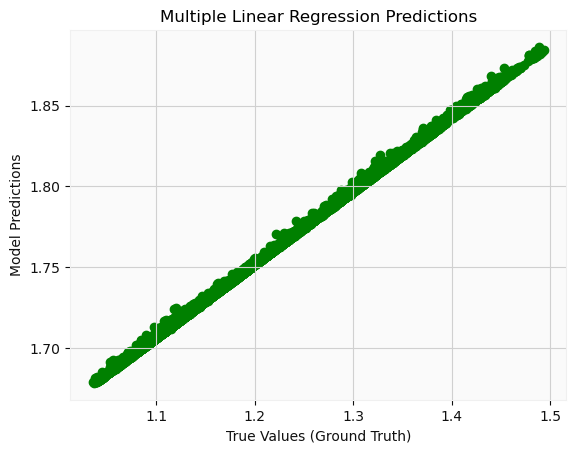

In [280]:
y_predict = model.predict(X_test)

plt.ylabel('Model Predictions')
plt.xlabel('True Values (Ground Truth)')
plt.title('Multiple Linear Regression Predictions')    
plt.scatter(y_test, y_predict, color = 'g')


C:\Users\joeyh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


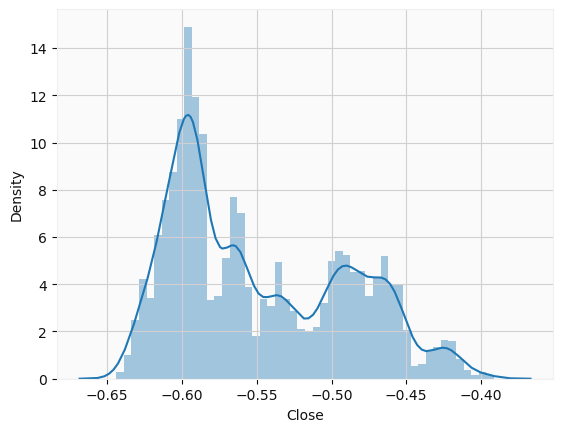

In [281]:
sns.distplot((y_test - y_predict), bins=50);

In [282]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train_minmax)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.5481914883718141
MSE: 0.3039326524243997
RMSE: 0.5513008728674386
R2 Square -25.537435644963953
__________________________________
Train set evaluation:
_____________________________________
MAE: 1.615502888047268e-16
MSE: 4.238806291399596e-32
RMSE: 2.0588361497213896e-16
R2 Square 1.0
__________________________________


In [283]:
results_df = pd.DataFrame(data=[["Linear Regression", *evaluate(y_test, test_pred) , cross_val(LinearRegression())]], 
                          columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.548191,0.303933,0.551301,-25.537436,1.0


#### B. Ridge Regression¶

In [284]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=100, solver='cholesky', tol=0.0001, random_state=42)
model.fit(X_train_minmax, y_train)


Ridge(alpha=100, random_state=42, solver='cholesky', tol=0.0001)

In [285]:
print('Ridge Regression Model Intercept: ', model.intercept_)
df_coeffi = pd.DataFrame(model.coef_, X.columns, columns = ['Coefficient'])
display(df_coeffi)

Ridge Regression Model Intercept:  1.0182839817469607


,Coefficient
Open,0.030201
High,0.030471
Low,0.030429
Volume,-0.001190
SMA09,0.029840
SMA12,0.029686
SMA24,0.029510
EMA09,0.030059
EMA12,0.029957
EMA13,0.029933


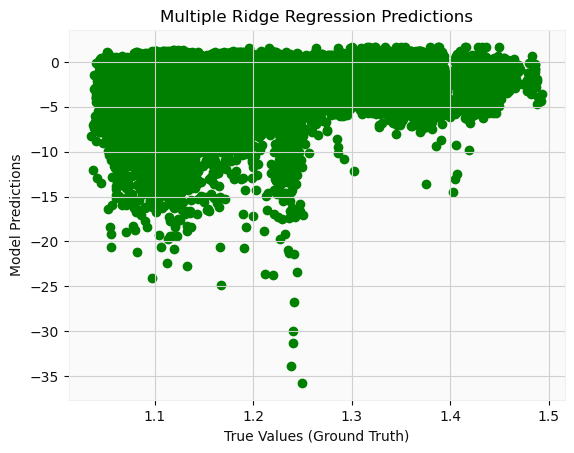

In [286]:
y_predict = model.predict(X_test)

plt.ylabel('Model Predictions')
plt.xlabel('True Values (Ground Truth)')
plt.title('Multiple Ridge Regression Predictions')    
plt.scatter(y_test, y_predict, color = 'g')

C:\Users\joeyh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


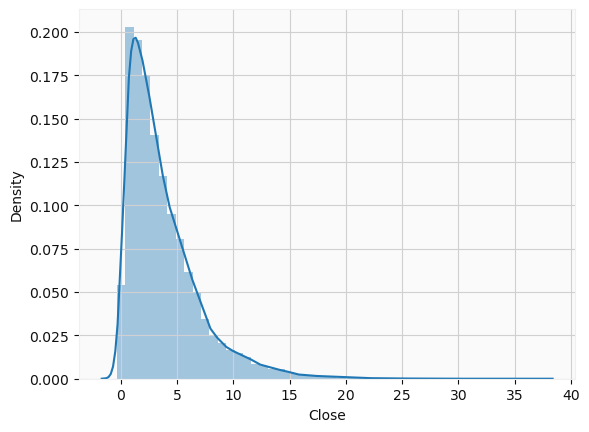

In [287]:
sns.distplot((y_test - y_predict), bins=50);

In [288]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train_minmax)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 3.738943423029995
MSE: 24.210421844043527
RMSE: 4.920408707012409
R2 Square -2112.8976233675517
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.000546194912584797
MSE: 5.409821174941187e-07
RMSE: 0.0007355148655833672
R2 Square 0.9999534997879646
__________________________________


In [289]:
results_df_2 = pd.DataFrame(data=[["Ridge Regression", *evaluate(y_test, test_pred) , cross_val(Ridge())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.548191,0.303933,0.551301,-25.537436,1.000000
1,Ridge Regression,3.738943,24.210422,4.920409,-2112.897623,0.999253


#### C. LASSO Regression

In [290]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=0.1, 
              precompute=True, 
              warm_start=True, 
              positive=True, 
              selection='random',
              random_state=42)
model.fit(X_train_minmax, y_train)



Lasso(alpha=0.1, positive=True, precompute=True, random_state=42,
      selection='random', warm_start=True)

In [291]:
print('LASSO Regression Model Intercept: ', model.intercept_)
df_coeffi = pd.DataFrame(model.coef_, X.columns, columns = ['Coefficient'])
display(df_coeffi)

LASSO Regression Model Intercept:  1.2085155168676642


,Coefficient
Open,0.0
High,0.0
Low,0.0
Volume,0.0
SMA09,0.0
SMA12,0.0
SMA24,0.0
EMA09,0.0
EMA12,0.0
EMA13,0.0


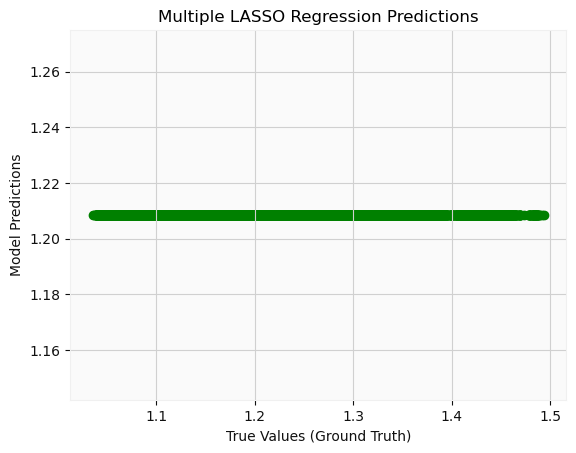

In [292]:
y_predict = model.predict(X_test)

plt.ylabel('Model Predictions')
plt.xlabel('True Values (Ground Truth)')
plt.title('Multiple LASSO Regression Predictions')    
plt.scatter(y_test, y_predict, color = 'g')

C:\Users\joeyh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


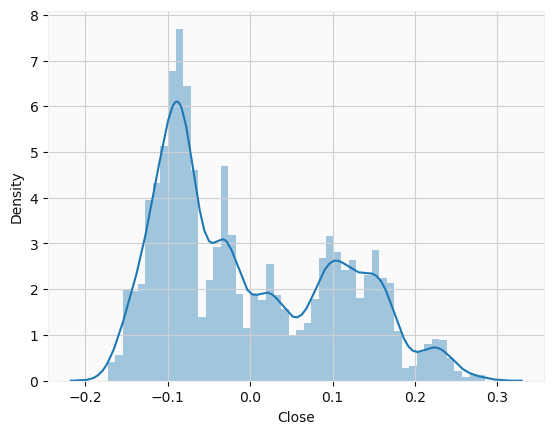

In [293]:
sns.distplot((y_test - y_predict), bins=50);

In [294]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train_minmax)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.09366913931930058
MSE: 0.011454726386218923
RMSE: 0.10702675546898974
R2 Square -0.00015270448958104588
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.0944700991607371
MSE: 0.01163397098237345
RMSE: 0.10786088717590567
R2 Square 0.0
__________________________________


In [295]:
results_df_2 = pd.DataFrame(data=[["Lasso Regression", *evaluate(y_test, test_pred) , cross_val(Lasso())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.548191,0.303933,0.551301,-25.537436,1.000000
1,Ridge Regression,3.738943,24.210422,4.920409,-2112.897623,0.999253
2,Lasso Regression,0.093669,0.011455,0.107027,-0.000153,-17.497156


#### D. Elastic Net

In [296]:
from sklearn.linear_model import ElasticNet

model = ElasticNet(alpha=0.1, l1_ratio=0.9, selection='random', random_state=42)
model.fit(X_train_minmax, y_train)

ElasticNet(alpha=0.1, l1_ratio=0.9, random_state=42, selection='random')

In [297]:
print('Elastic Net Regression Model Intercept: ', model.intercept_)
df_coeffi = pd.DataFrame(model.coef_, X.columns, columns = ['Coefficient'])
display(df_coeffi)

Elastic Net Regression Model Intercept:  1.2085155168676642


,Coefficient
Open,0.0
High,0.0
Low,0.0
Volume,0.0
SMA09,0.0
SMA12,0.0
SMA24,0.0
EMA09,0.0
EMA12,0.0
EMA13,0.0


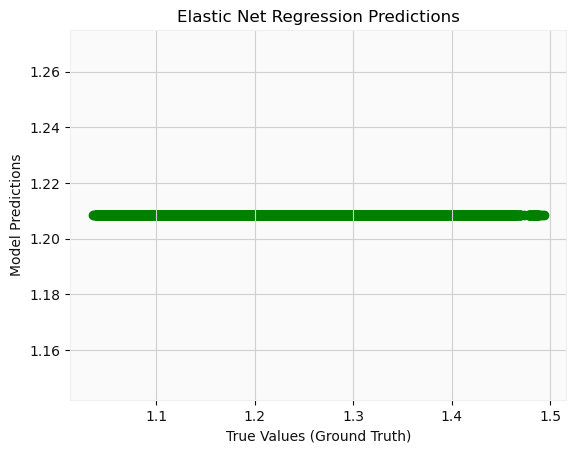

In [298]:
y_predict = model.predict(X_test)

plt.ylabel('Model Predictions')
plt.xlabel('True Values (Ground Truth)')
plt.title('Elastic Net Regression Predictions')    
plt.scatter(y_test, y_predict, color = 'g')

C:\Users\joeyh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


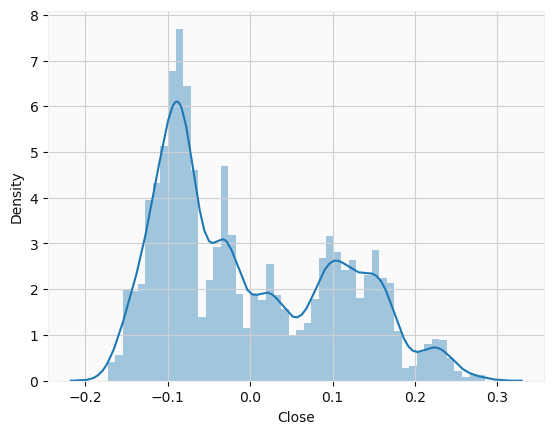

In [299]:
sns.distplot((y_test - y_predict), bins=50);

In [300]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train_minmax)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.09366913931930058
MSE: 0.011454726386218923
RMSE: 0.10702675546898974
R2 Square -0.00015270448958104588
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.0944700991607371
MSE: 0.01163397098237345
RMSE: 0.10786088717590567
R2 Square 0.0
__________________________________


In [301]:
results_df_2 = pd.DataFrame(data=[["Elastic Net Regression", *evaluate(y_test, test_pred) , cross_val(ElasticNet())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,0.548191,0.303933,0.551301,-25.537436,1.000000
1,Ridge Regression,3.738943,24.210422,4.920409,-2112.897623,0.999253
2,Lasso Regression,0.093669,0.011455,0.107027,-0.000153,-17.497156
3,Elastic Net Regression,0.093669,0.011455,0.107027,-0.000153,-17.505475


#### E. Polynomial Regression

In [302]:
from sklearn.preprocessing import PolynomialFeatures

model = PolynomialFeatures(degree=2)
X_train_2_d = model.fit_transform(X_train)
X_test_2_d = model.transform(X_test)


In [303]:
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train_2_d,y_train)

test_pred = lin_reg.predict(X_test_2_d)
train_pred = lin_reg.predict(X_train_2_d)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 4.552236966568059e-16
MSE: 3.545863132165414e-31
RMSE: 5.954715049576608e-16
R2 Square 1.0
__________________________________
Train set evaluation:
_____________________________________
MAE: 4.509655421860397e-16
MSE: 3.313952056341486e-31
RMSE: 5.75669354433731e-16
R2 Square 1.0
__________________________________


In [304]:
results_df_2 = pd.DataFrame(data=[["Polynomail Regression", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,5.481915e-01,3.039327e-01,5.513009e-01,-25.537436,1.000000
1,Ridge Regression,3.738943e+00,2.421042e+01,4.920409e+00,-2112.897623,0.999253
2,Lasso Regression,9.366914e-02,1.145473e-02,1.070268e-01,-0.000153,-17.497156
3,Elastic Net Regression,9.366914e-02,1.145473e-02,1.070268e-01,-0.000153,-17.505475
4,Polynomail Regression,4.552237e-16,3.545863e-31,5.954715e-16,1.000000,0.000000


#### F. Robust Regression

In [305]:
from sklearn.linear_model import RANSACRegressor

model = RANSACRegressor(base_estimator=LinearRegression(), max_trials=100)
model.fit(X_train_minmax, y_train)


RANSACRegressor(base_estimator=LinearRegression())

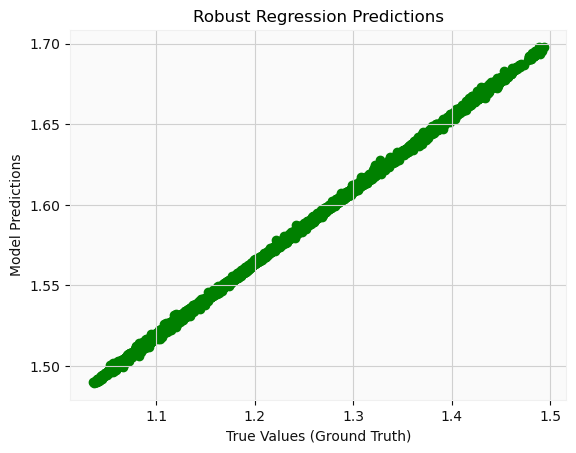

In [306]:
y_predict = model.predict(X_test)

plt.ylabel('Model Predictions')
plt.xlabel('True Values (Ground Truth)')
plt.title('Robust Regression Predictions')    
plt.scatter(y_test, y_predict, color = 'g')

C:\Users\joeyh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


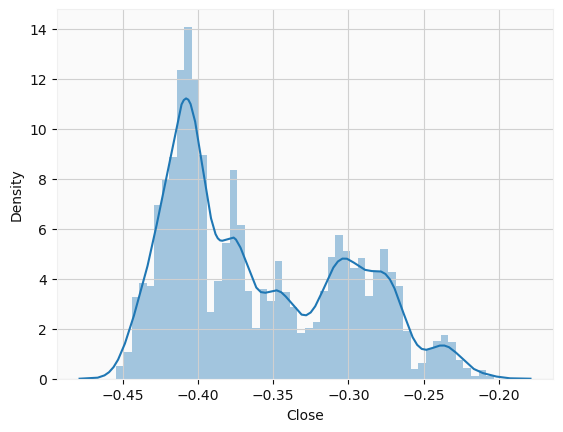

In [307]:
sns.distplot((y_test - y_predict), bins=50);

In [238]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train_minmax)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.3600683402804488
MSE: 0.13305198451887887
RMSE: 0.36476291549289774
R2 Square -10.617239702413201
__________________________________
Train set evaluation:
_____________________________________
MAE: 1.7585592733541922e-16
MSE: 6.35616302273277e-32
RMSE: 2.521143197585724e-16
R2 Square 1.0
__________________________________


In [239]:
results_df_2 = pd.DataFrame(data=[["Robust Regression", *evaluate(y_test, test_pred) , cross_val(RANSACRegressor())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,5.481915e-01,3.039327e-01,5.513009e-01,-25.537436,1.000000
1,Ridge Regression,3.738943e+00,2.421042e+01,4.920409e+00,-2112.897623,0.999253
2,Lasso Regression,9.366914e-02,1.145473e-02,1.070268e-01,-0.000153,-17.497156
3,Elastic Net Regression,9.366914e-02,1.145473e-02,1.070268e-01,-0.000153,-17.505475
4,Polynomail Regression,4.552237e-16,3.545863e-31,5.954715e-16,1.000000,0.000000
5,Robust Regression,3.600683e-01,1.330520e-01,3.647629e-01,-10.617240,1.000000


### 9.  Models Comparison

<AxesSubplot:ylabel='Model'>

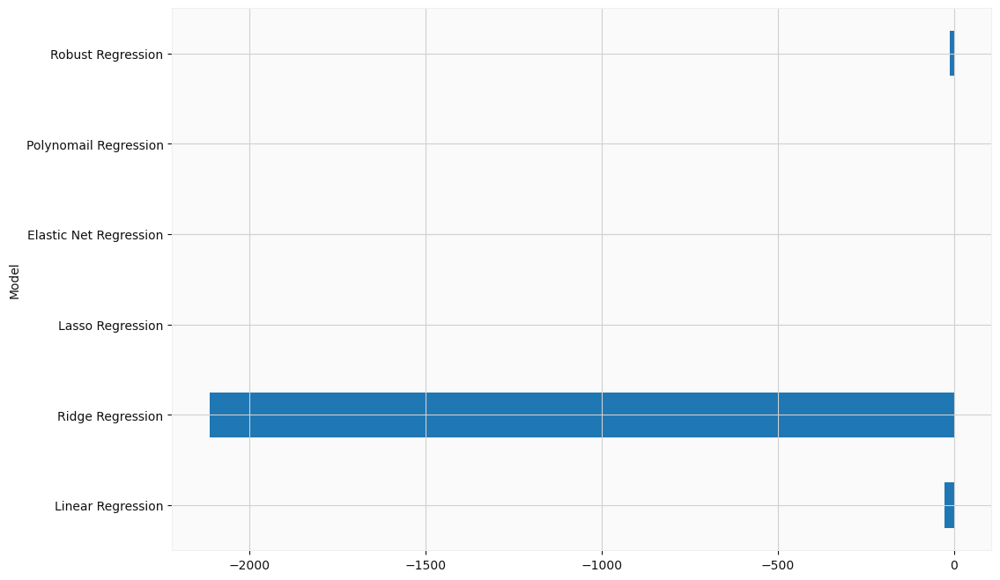

In [240]:
results_df.set_index('Model', inplace=True)
results_df['R2 Square'].plot(kind='barh', figsize=(12, 8))

 > <font color='green'> * **The model presented the best result is Lasso Regression with smallest R2 Square value** </font>

### 10. The Selected Model - LASSO Regression

In [241]:
model = Lasso(alpha=0.1, 
              precompute=True, 
              warm_start=True, 
              positive=True, 
              selection='random',
              random_state=42)
model.fit(X_train_minmax, y_train)

Lasso(alpha=0.1, positive=True, precompute=True, random_state=42,
      selection='random', warm_start=True)

In [242]:
print('LASSO Regression Model Intercept: ', model.intercept_)
df_coeffi = pd.DataFrame(model.coef_, X.columns, columns = ['Coefficient'])
display(df_coeffi)

LASSO Regression Model Intercept:  1.2085155168676642


,Coefficient
Open,0.0
High,0.0
Low,0.0
Volume,0.0
SMA09,0.0
SMA12,0.0
SMA24,0.0
EMA09,0.0
EMA12,0.0
EMA13,0.0


In [243]:
y_predict = model.predict(X_test)

predict_EURUSD = X_test.sort_index()
predict_EURUSD.insert(loc=3,column='Close',value=y_predict)

predict_EURUSD.head(5)


,Open,High,Low,Close,Volume,SMA09,SMA12,SMA24,EMA09,EMA12,...,Min24,Max24,OpenVsClose,HighVsLow,Close_Vs_exClose,Open_Vs_exOpen,Average,Momentum,Bull_Power,Bear_Power
Date_&_Time,,,,,,,,,,,,,,,,,,,,,
2011-04-01 01:00:00,1.41733,1.41737,1.41563,1.208516,1850,1.418049,1.418428,1.417351,1.417545,1.417636,...,1.41269,1.42266,-0.00165,0.00174,-0.00168,0.00164,1.416500,-3.05250,-0.000251,-0.001991
2011-04-01 08:00:00,1.41705,1.41763,1.41658,1.208516,1973,1.416414,1.416722,1.418104,1.416809,1.416891,...,1.41555,1.42266,0.00034,0.00105,0.00033,0.00069,1.417105,0.67082,0.000721,-0.000329
2011-04-01 09:00:00,1.41739,1.41771,1.41577,1.208516,2824,1.416270,1.416392,1.418086,1.416659,1.416763,...,1.41555,1.42266,-0.00133,0.00194,-0.00133,0.00034,1.416740,-3.75592,0.000922,-0.001018
2011-04-01 15:00:00,1.41563,1.41588,1.40900,1.208516,4863,1.415402,1.415573,1.416643,1.414754,1.415164,...,1.41018,1.42015,-0.00545,0.00688,-0.00543,0.00087,1.412440,-26.50335,0.000609,-0.006271
2011-04-01 19:00:00,1.42114,1.42151,1.41935,1.208516,3220,1.415141,1.415430,1.416191,1.416242,1.416032,...,1.40654,1.42151,0.00037,0.00216,0.00036,0.00672,1.420430,1.19140,0.005505,0.003345


In [244]:
predict_EURUSD = predict_EURUSD.drop(['SMA09', 'SMA12', 'SMA24',
       'EMA09', 'EMA12', 'EMA13', 'EMA26', 'MACD', 'Min12', 'Max12', 'Min24',
       'Max24', 'OpenVsClose', 'HighVsLow', 'Close_Vs_exClose',
       'Open_Vs_exOpen', 'Average', 'Momentum', 'Bull_Power', 'Bear_Power'], axis=1)

In [245]:
predict_EURUSD.describe()

,Open,High,Low,Close,Volume
count,18586.000000,18586.000000,18586.000000,1.858600e+04,18586.000000
mean,1.207194,1.208055,1.206356,1.208516e+00,3438.121113
std,0.107030,0.107110,0.106940,1.925179e-13,2701.678891
min,1.036930,1.037850,1.032490,1.208516e+00,1.000000
25%,1.118155,1.118952,1.117363,1.208516e+00,1495.000000
50%,1.177295,1.177895,1.176575,1.208516e+00,2693.000000
75%,1.304435,1.305320,1.303440,1.208516e+00,4583.750000
max,1.493150,1.493850,1.490500,1.208516e+00,31350.000000


In [246]:
predict_EURUSD.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')

In [247]:
predict_EURUSD.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18586 entries, 2011-04-01 01:00:00 to 2021-03-31 22:00:00
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    18586 non-null  float64
 1   High    18586 non-null  float64
 2   Low     18586 non-null  float64
 3   Close   18586 non-null  float64
 4   Volume  18586 non-null  int64  
dtypes: float64(4), int64(1)
memory usage: 871.2 KB


In [248]:
predict_EURUSD.describe()

,Open,High,Low,Close,Volume
count,18586.000000,18586.000000,18586.000000,1.858600e+04,18586.000000
mean,1.207194,1.208055,1.206356,1.208516e+00,3438.121113
std,0.107030,0.107110,0.106940,1.925179e-13,2701.678891
min,1.036930,1.037850,1.032490,1.208516e+00,1.000000
25%,1.118155,1.118952,1.117363,1.208516e+00,1495.000000
50%,1.177295,1.177895,1.176575,1.208516e+00,2693.000000
75%,1.304435,1.305320,1.303440,1.208516e+00,4583.750000
max,1.493150,1.493850,1.490500,1.208516e+00,31350.000000


C:\Users\joeyh\anaconda3\lib\site-packages\mplfinance\_arg_validators.py:35: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


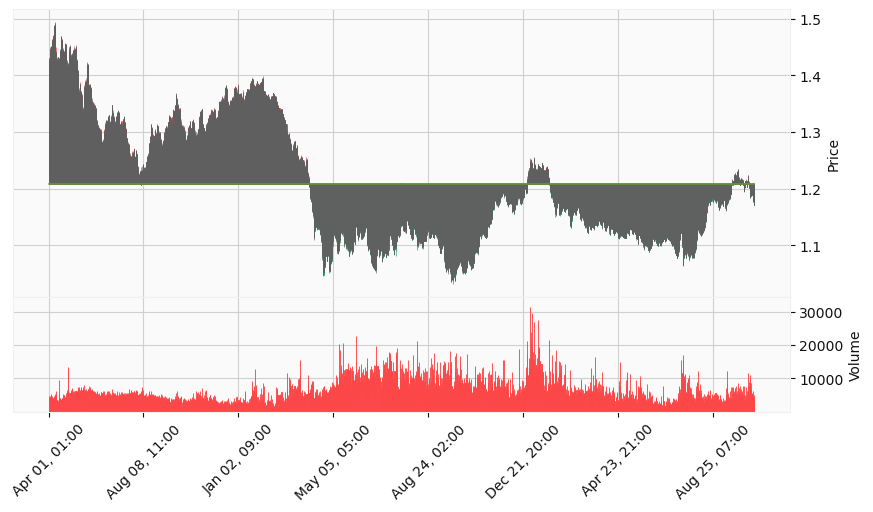

In [249]:
# Set the kwargs that we will use for all of these examples:
kwargs = dict(type='candle', mav=(9,12,24),volume=True,figratio=(15,8),figscale=1)

mpf.plot(predict_EURUSD, **kwargs,style='yahoo')

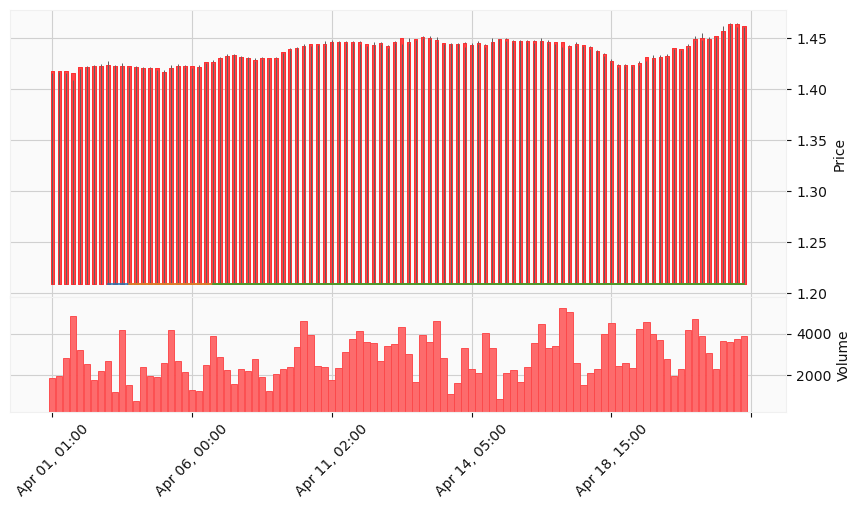

In [250]:
# Set the kwargs that we will use for all of these examples:
kwargs = dict(type='candle', mav=(9,12,24),volume=True,figratio=(15,8),figscale=1)

mpf.plot(predict_EURUSD.head(100), **kwargs,style='yahoo')